# Stable Diffusion: A Walkthrough

Stable Diffusion (Rombach et al., 2022) is a latent diffusion model that
generates images by iteratively denoising in a compressed latent space rather
than in pixel space, which is an order-of-magnitude faster than denoising in pixel space.

It is a composition of three independently trained neural networks plus an
algorithmic scheduler:

- Text Encoder (CLIP): maps a text prompt to embedding vectors that condition
  the diffusion process. Pretrained on 400M image-text pairs (contrastive
  learning, OpenAI). Frozen during diffusion training.
- VAE: compresses images into a small latent space (encoder) and reconstructs
  them back (decoder). Pretrained as a KL-regularized autoencoder on images,
  independently of diffusion. Frozen during SD v1.x training (later variants
  may fine-tune it).
- UNet: predicts the noise in a noisy latent, conditioned on text (via
  cross-attention) and timestep. This is the only component trained for the
  diffusion objective.
- Scheduler: defines the noise schedule and denoising update rule. Not
  jointly trained, but its schedule is chosen/tuned as a training
  hyperparameter. No learned parameters at inference.

So in SD v1.x, CLIP and the VAE are "borrowed" from prior work and kept
frozen, while only the UNet learns to denoise. Modern successors (SDXL, Flux)
swap individual parts (e.g. DiT instead of UNet, T5 instead of CLIP), and
some (e.g. flow matching models) are not strictly diffusion models, but the
overall compositional recipe remains.

<img src="stable_diffusion_architecture.png" width="50%">

To generate an image from a text prompt:

1. The text encoder (frozen CLIP) maps the prompt to embedding vectors.
2. A random latent is sampled from Gaussian noise in the VAE's latent space.
3. The UNet iteratively denoises the latent, guided by the text embeddings
   and the scheduler's timestep schedule.
4. The VAE decoder (frozen) maps the denoised latent back to pixel space.

We will inspect each component in isolation, feed it real data, and see
exactly what goes in and comes out. At the end we stitch them together
into a full generation loop.

In [1]:
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import torch
from tqdm.auto import tqdm

from diffusers import DDPMScheduler, PNDMScheduler, StableDiffusionPipeline
from utils import (
    count_parameters,
    get_device,
    image_to_tensor,
    load_image,
    show_images,
    show_latent_channels,
    tensor_to_image,
)

%matplotlib inline

/Users/weigert/miniforge3/envs/py312/lib/python3.12/site-packages/torch/amp/autocast_mode.py:270: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn(


In [2]:
# --- Load the Stable Diffusion v1.5 pipeline and extract components ---

device = get_device()
dtype = torch.float16 if device == "cuda" else torch.float32
print(f"Device: {device}, dtype: {dtype}")

pipe = StableDiffusionPipeline.from_pretrained(
    "stable-diffusion-v1-5/stable-diffusion-v1-5",
    torch_dtype=dtype,
).to(device)

# Extract the four main components
tokenizer = pipe.tokenizer
text_encoder = pipe.text_encoder
vae = pipe.vae
unet = pipe.unet

print(f"Text Encoder : {type(text_encoder).__name__:>30s}  ({count_parameters(text_encoder)} params)")
print(f"VAE          : {type(vae).__name__:>30s}  ({count_parameters(vae)} params)")
print(f"UNet         : {type(unet).__name__:>30s}  ({count_parameters(unet)} params)")

Device: mps, dtype: torch.float32


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /Users/weigert/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /Users/weigert/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Text Encoder :                  CLIPTextModel  (123.1M params)
VAE          :                  AutoencoderKL  (83.7M params)
UNet         :           UNet2DConditionModel  (859.5M params)


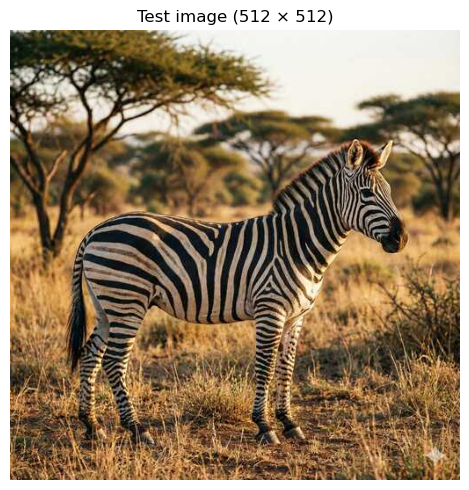

In [3]:
# --- Load a test image ---

img = load_image(Path("data/zebra.jpg"), size=512)

plt.figure(figsize=(5, 5), num=1, clear=True)
plt.imshow(img)
plt.axis("off")
plt.title("Test image (512 × 512)")
plt.tight_layout()
plt.show()

---
## 1. Text Encoder (CLIP)

Stable Diffusion uses the text encoder from OpenAI's CLIP
(ViT-L/14). The tokenizer converts a string into a fixed-length
sequence of 77 token IDs, and the transformer maps these to
77 × 768-dimensional embeddings that the UNet later attends to
via cross-attention.


In [4]:
# --- Tokenization ---

prompts = [
    "a photograph of a zebra in the savanna",
    "an oil painting of a zebra",
    "a zebra",
]

for p in prompts:
    tokens = tokenizer(p, padding=False, truncation=True)
    ids = tokens["input_ids"]
    decoded = tokenizer.convert_ids_to_tokens(ids)
    print(f"[{len(ids):2d} tokens] {p}")
    print(f"           {decoded}\n")

print(f"Vocabulary size : {tokenizer.vocab_size}")
print(f"Max token length: {tokenizer.model_max_length}")

[11 tokens] a photograph of a zebra in the savanna
           ['<|startoftext|>', 'a</w>', 'photograph</w>', 'of</w>', 'a</w>', 'zebra</w>', 'in</w>', 'the</w>', 'sav', 'anna</w>', '<|endoftext|>']

[ 8 tokens] an oil painting of a zebra
           ['<|startoftext|>', 'an</w>', 'oil</w>', 'painting</w>', 'of</w>', 'a</w>', 'zebra</w>', '<|endoftext|>']

[ 4 tokens] a zebra
           ['<|startoftext|>', 'a</w>', 'zebra</w>', '<|endoftext|>']

Vocabulary size : 49408
Max token length: 77


Input token IDs shape : torch.Size([1, 77])
Text embedding shape  : torch.Size([1, 77, 768])
Actual tokens         : 11 of 77


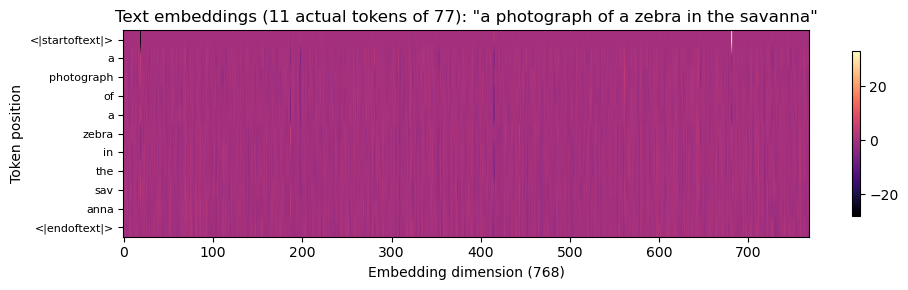

In [5]:
# --- Text encoding (only actual tokens shown, not padding) ---

prompt = "a photograph of a zebra in the savanna"

# Get the actual (non-padded) token count and labels
tokens_unpadded = tokenizer(prompt, padding=False, truncation=True)
n_actual = len(tokens_unpadded["input_ids"])
token_labels = [t.replace("</w>", "") for t in tokenizer.convert_ids_to_tokens(tokens_unpadded["input_ids"])]

# Encode with full padding (required by the model)
tok = tokenizer(
    prompt,
    padding="max_length",
    max_length=tokenizer.model_max_length,
    truncation=True,
    return_tensors="pt",
)

with torch.no_grad():
    text_embeddings = text_encoder(tok.input_ids.to(device))[0]

print(f"Input token IDs shape : {tok.input_ids.shape}")         # (1, 77)
print(f"Text embedding shape  : {text_embeddings.shape}")        # (1, 77, 768)
print(f"Actual tokens         : {n_actual} of {tokenizer.model_max_length}")

# Visualize only the non-padded token embeddings
emb_actual = text_embeddings[0, :n_actual].cpu().float()

plt.figure(figsize=(10, 3), num=1, clear=True)
plt.imshow(emb_actual.numpy(), aspect="auto", cmap="magma")
plt.xlabel("Embedding dimension (768)")
plt.ylabel("Token position")
plt.yticks(range(n_actual), token_labels, fontsize=8)
plt.title(f"Text embeddings ({n_actual} actual tokens of {tokenizer.model_max_length}): \"{prompt}\"")
plt.colorbar(shrink=0.8)
plt.tight_layout()
plt.show()

Most similar pair: 'in' and 'the' (cosine similarity: 0.812)


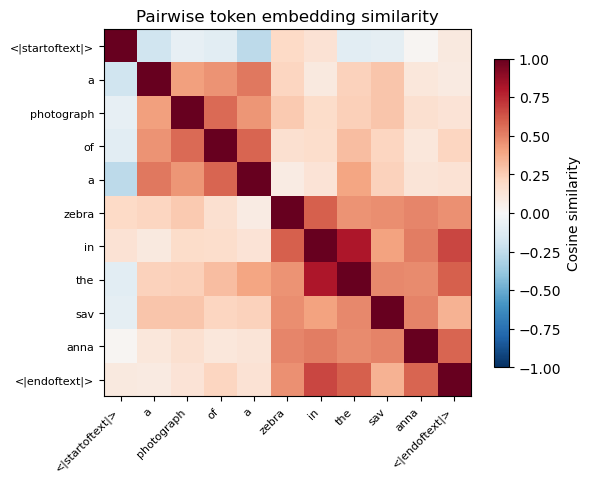

In [6]:
# --- Pairwise cosine similarity between token embeddings ---

emb_norm = emb_actual / emb_actual.norm(dim=1, keepdim=True)
similarity = (emb_norm @ emb_norm.T).numpy()

# Find most similar pair (excluding self-similarity on diagonal)
sim_offdiag = similarity.copy()
np.fill_diagonal(sim_offdiag, -np.inf)
i, j = np.unravel_index(sim_offdiag.argmax(), sim_offdiag.shape)
print(f"Most similar pair: '{token_labels[i]}' and '{token_labels[j]}' "
      f"(cosine similarity: {sim_offdiag[i, j]:.3f})")

plt.figure(figsize=(6, 5), num=1, clear=True)
plt.imshow(similarity, cmap="RdBu_r", vmin=-1, vmax=1)
plt.xticks(range(n_actual), token_labels, rotation=45, ha="right", fontsize=8)
plt.yticks(range(n_actual), token_labels, fontsize=8)
plt.colorbar(shrink=0.8, label="Cosine similarity")
plt.title("Pairwise token embedding similarity")
plt.tight_layout()
plt.show()

---
## 2. Variational Autoencoder (VAE)

The VAE compresses pixel-space images into a much smaller latent space:

- Encoder: 3 × 512 × 512 → 4 × 64 × 64 (8× spatial compression)
- Decoder: 4 × 64 × 64 → 3 × 512 × 512

This reduces the data by a factor of 48× which is why diffusion in latent 
space is so much cheaper than in pixel space.


In [7]:
# --- Encode the zebra image into latent space ---

img_tensor = image_to_tensor(img).to(device, dtype=dtype)  # (1, 3, 512, 512)
scaling_factor = vae.config.scaling_factor

with torch.no_grad():
    latent_dist = vae.encode(img_tensor).latent_dist

print(f"Input (pixel space)  : {img_tensor.shape}  ({img_tensor.numel():,} values)")
print(f"Posterior mean shape : {latent_dist.mean.shape}")
print(f"Posterior std shape  : {latent_dist.std.shape}")
print(f"Compression ratio   : {img_tensor.numel() / latent_dist.mean.numel():.1f}×")
print(f"VAE scaling factor  : {scaling_factor}")
print(f"\nPosterior statistics:")
print(f"  mu    : mean={latent_dist.mean.mean():.3f}, std={latent_dist.mean.std():.3f}")
print(f"  sigma : mean={latent_dist.std.mean():.3f}, std={latent_dist.std.std():.3f}")

Input (pixel space)  : torch.Size([1, 3, 512, 512])  (786,432 values)
Posterior mean shape : torch.Size([1, 4, 64, 64])
Posterior std shape  : torch.Size([1, 4, 64, 64])
Compression ratio   : 48.0×
VAE scaling factor  : 0.18215

Posterior statistics:
  mu    : mean=0.449, std=4.445
  sigma : mean=0.001, std=0.001


### How does VAE sampling work?

The encoder outputs two tensors of shape (1, 4, 64, 64):

- $\mu$ (mean): captures the spatial structure of the image
- $\sigma$ (standard deviation): per-element uncertainty

A latent sample is drawn via the reparameterization trick:

$$z = \mu + \sigma \cdot \varepsilon, \quad \varepsilon \sim \mathcal{N}(0, I)$$

The VAE loss balances two competing terms:

$$\mathcal{L} = \underbrace{\|x - \hat{x}\|^2}_{\text{reconstruction}} + \underbrace{\beta \cdot D_\text{KL}(q(z|x) \,\|\, \mathcal{N}(0,I))}_{\text{regularization}}$$

- The KL term pushes $\sigma \to 1$ and $\mu \to 0$ (toward the prior)
- The reconstruction term pushes $\sigma \to 0$ (deterministic = better reconstruction)

The SD VAE uses a very small KL weight $\beta$, so reconstruction
dominates and $\sigma$ collapses to near zero. The VAE is effectively
a regularized autoencoder: the generative stochasticity comes from
the diffusion model, not the VAE.

After sampling, the latent is multiplied by a scaling factor (0.18215),
a training-time normalization convention that ensures unit variance
inputs for the UNet (not a theoretical VAE property).

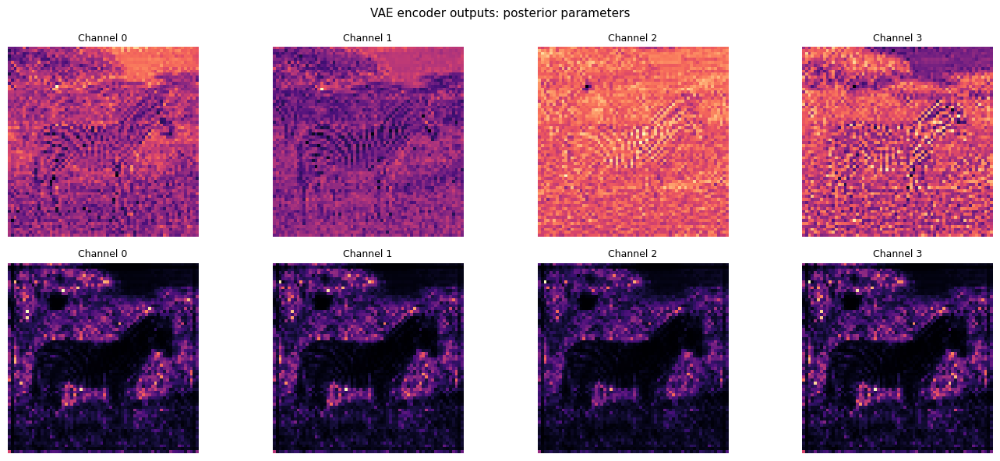

In [8]:
# --- Visualize mu and sigma channels ---

fig, axes = plt.subplots(2, 4, figsize=(14, 6))
for i in range(4):
    axes[0, i].imshow(latent_dist.mean[0, i].cpu().float().numpy(), cmap="magma")
    axes[0, i].set_title(f"Channel {i}", fontsize=9)
    axes[0, i].axis("off")

    axes[1, i].imshow(latent_dist.std[0, i].cpu().float().numpy(), cmap="magma")
    axes[1, i].set_title(f"Channel {i}", fontsize=9)
    axes[1, i].axis("off")

axes[0, 0].set_ylabel(r"$\mu$ (mean)", fontsize=10)
axes[1, 0].set_ylabel(r"$\sigma$ (std)", fontsize=10)
fig.suptitle("VAE encoder outputs: posterior parameters", fontsize=11)
plt.tight_layout()
plt.show()

Sampled latent shape: torch.Size([1, 4, 64, 64])
Latent stats: mean=0.082, std=0.810


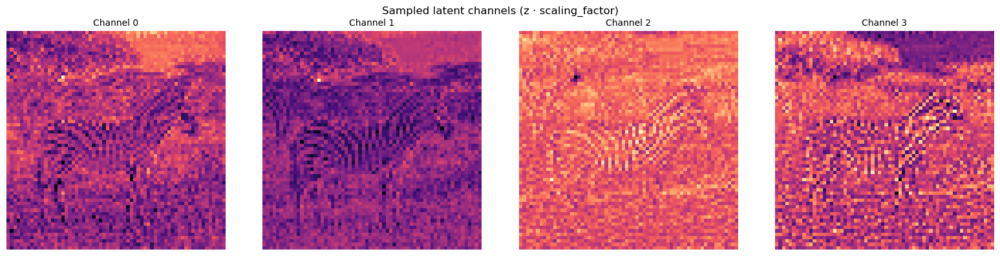

In [9]:
# --- Sample from the posterior and visualize ---

# Manual reparameterization: z = mu + sigma * eps
latent_samples = [
    (latent_dist.mean + latent_dist.std * torch.randn_like(latent_dist.mean)) * scaling_factor
    for _ in range(3)
]
latent = latent_samples[0]  # keep first sample for later use

print(f"Sampled latent shape: {latent.shape}")
print(f"Latent stats: mean={latent.mean():.3f}, std={latent.std():.3f}")

show_latent_channels(latent, title="Sampled latent channels (z · scaling_factor)")

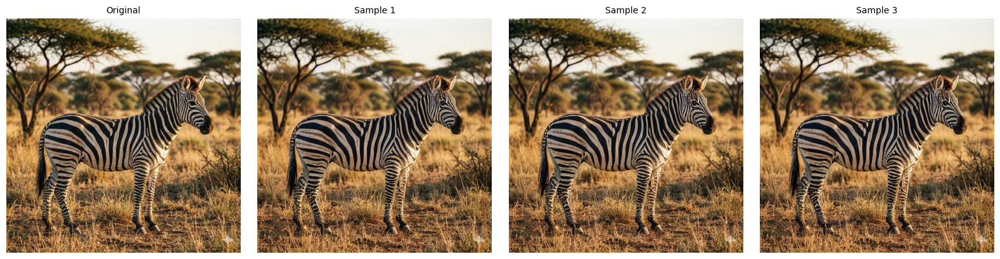

In [10]:
# --- Decode 3 different samples from the same posterior ---
# Samples look nearly identical because sigma is small —
# the VAE has learned a nearly deterministic encoding.

samples_decoded = []
for z in latent_samples:
    with torch.no_grad():
        dec = vae.decode(z / scaling_factor).sample
    samples_decoded.append(tensor_to_image(dec))

show_images(
    [tensor_to_image(img_tensor)] + samples_decoded,
    ["Original"] + [f"Sample {i+1}" for i in range(3)],
)

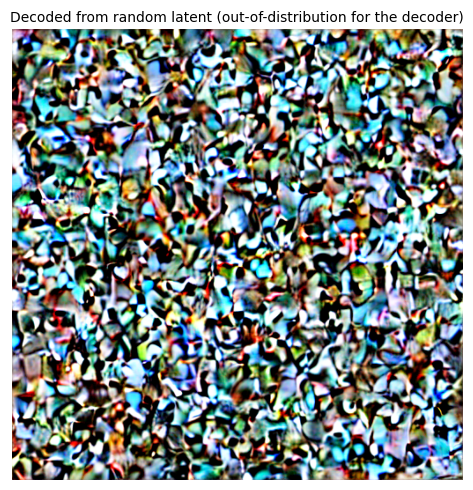

In [11]:
# --- What happens if we decode a random latent? ---
# Without a diffusion model to produce structured latents, we get noise.

random_latent = torch.randn_like(latent)

with torch.no_grad():
    random_decoded = vae.decode(random_latent / scaling_factor).sample

show_images(
    [tensor_to_image(random_decoded)],
    ["Decoded from random latent (out-of-distribution for the decoder)"],
    figsize_per=5,
)

---
## 3. Noise Schedule (Forward Process)

The forward diffusion process gradually adds Gaussian noise to a
clean sample over $T = 1000$ timesteps. Following the lecture notation:

Single step:
$$X_t = \sqrt{1-\beta_t}\,X_{t-1} + \sqrt{\beta_t}\,\varepsilon_t, \quad \varepsilon_t \sim \mathcal{N}(0,I)$$

Direct jump from $X_0$ to $X_t$ (sums of Gaussians are Gaussian):
$$X_t = \sqrt{\bar\alpha_t}\,X_0 + \sqrt{1-\bar\alpha_t}\,\varepsilon, \quad \varepsilon \sim \mathcal{N}(0,I)$$

where:

- $\beta_t$: noise schedule (noise added at step $t$, increasing over time)
- $\alpha_t = 1 - \beta_t$: signal retention per step
- $\bar\alpha_t = \prod_{s=1}^t \alpha_s$: cumulative signal remaining after $t$ steps

At $t=0$: $\bar\alpha_0 \approx 1$ (almost clean).
At $t=T$: $\bar\alpha_T \approx 0$ (pure noise).

SD v1.5 uses a scaled-linear $\beta$ schedule
$\beta_t = \text{linspace}(\sqrt{\beta_\min}, \sqrt{\beta_\max}, T)^2$
Modern models use cosine schedules or  continuous-time flow matching.

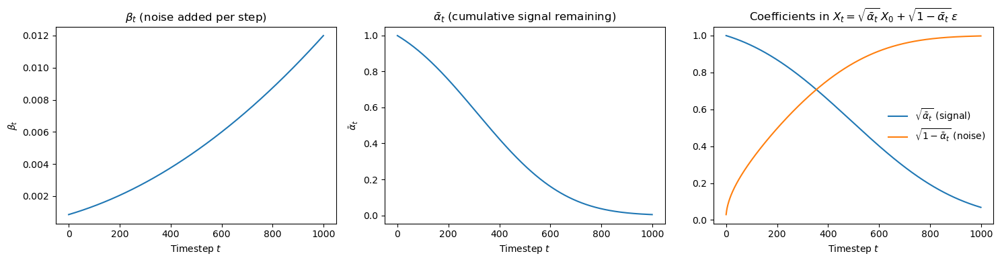

In [20]:
# --- Visualize the noise schedule ---

scheduler = DDPMScheduler.from_config(pipe.scheduler.config)

betas = scheduler.betas.numpy()
alphas_cumprod = scheduler.alphas_cumprod.numpy()

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

axes[0].plot(betas)
axes[0].set_title(r"$\beta_t$ (noise added per step)")
axes[0].set_xlabel("Timestep $t$")
axes[0].set_ylabel(r"$\beta_t$")

axes[1].plot(alphas_cumprod)
axes[1].set_title(r"$\bar{\alpha}_t$ (cumulative signal remaining)")
axes[1].set_xlabel("Timestep $t$")
axes[1].set_ylabel(r"$\bar{\alpha}_t$")

signal_coef = alphas_cumprod**0.5
noise_coef = (1 - alphas_cumprod) ** 0.5
axes[2].plot(signal_coef, label=r"$\sqrt{\bar{\alpha}_t}$ (signal)")
axes[2].plot(noise_coef, label=r"$\sqrt{1-\bar{\alpha}_t}$ (noise)")
axes[2].legend(frameon=False)
axes[2].set_title(r"Coefficients in $X_t = \sqrt{\bar{\alpha}_t}\,X_0 + \sqrt{1-\bar{\alpha}_t}\,\varepsilon$")
axes[2].set_xlabel("Timestep $t$")

plt.tight_layout()
plt.show()

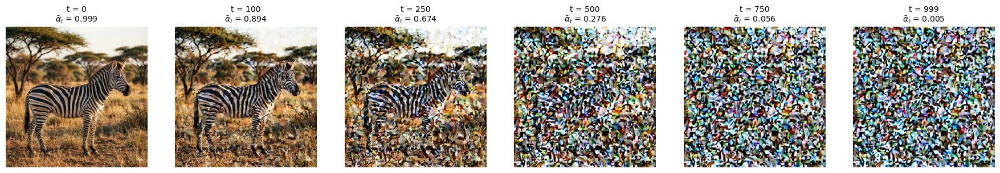

In [21]:
# --- Progressive noising of the zebra latent ---
# Apply the forward model at different timesteps to see how the image degrades.

timesteps_to_show = [0, 100, 250, 500, 750, 999]
noise = torch.randn_like(latent)

decoded_noised = []
titles_noised = []
for t in timesteps_to_show:
    ab = float(scheduler.alphas_cumprod[t])
    noisy = (ab**0.5) * latent + ((1 - ab) ** 0.5) * noise
    with torch.no_grad():
        dec = vae.decode(noisy / scaling_factor).sample
    decoded_noised.append(tensor_to_image(dec))
    titles_noised.append(f"t = {t}\n" + r"$\bar{\alpha}_t$" + f" = {ab:.3f}")

show_images(decoded_noised, titles_noised, figsize_per=3)

---
## 4. UNet (Noise Predictor)

The UNet is the core of the diffusion model. It is trained to predict the
noise $\varepsilon_\theta(X_t, t, c)$ with a simple MSE objective:

$$L = \mathbb{E}_{t,\varepsilon}\left[\|\varepsilon - \varepsilon_\theta(X_t, t, c)\|^2\right]$$

At each denoising step it takes three inputs:

1. Noisy latent (4 × 64 × 64): the current state
2. Timestep: encoded via sinusoidal embeddings, tells the model
   how noisy the input is
3. Text embeddings (77 × 768): injected via cross-attention layers
   where latent features are the queries and text embeddings provide
   keys and values

From the predicted noise, we can estimate the clean image:
$$\hat{X}_0 = \frac{X_t - \sqrt{1-\bar\alpha_t}\,\varepsilon_\theta}{\sqrt{\bar\alpha_t}}$$


In [22]:
# --- UNet architecture overview ---

print(f"Parameters      : {count_parameters(unet)}")
print(f"Input channels  : {unet.config.in_channels}")
print(f"Output channels : {unet.config.out_channels}")
print(f"Block out channels: {unet.config.block_out_channels}")
print(f"Cross-attn dim  : {unet.config.cross_attention_dim}")
print(f"Attention head dim: {unet.config.attention_head_dim}")
print(f"Down block types: {unet.config.down_block_types}")
print(f"Up block types  : {unet.config.up_block_types}")

Parameters      : 859.5M
Input channels  : 4
Output channels : 4
Block out channels: [320, 640, 1280, 1280]
Cross-attn dim  : 768
Attention head dim: 8
Down block types: ['CrossAttnDownBlock2D', 'CrossAttnDownBlock2D', 'CrossAttnDownBlock2D', 'DownBlock2D']
Up block types  : ['UpBlock2D', 'CrossAttnUpBlock2D', 'CrossAttnUpBlock2D', 'CrossAttnUpBlock2D']


Timestep          : t = 958
alpha_bar_t       : 0.0075
UNet input shape  : torch.Size([1, 4, 64, 64])
UNet output shape : torch.Size([1, 4, 64, 64])


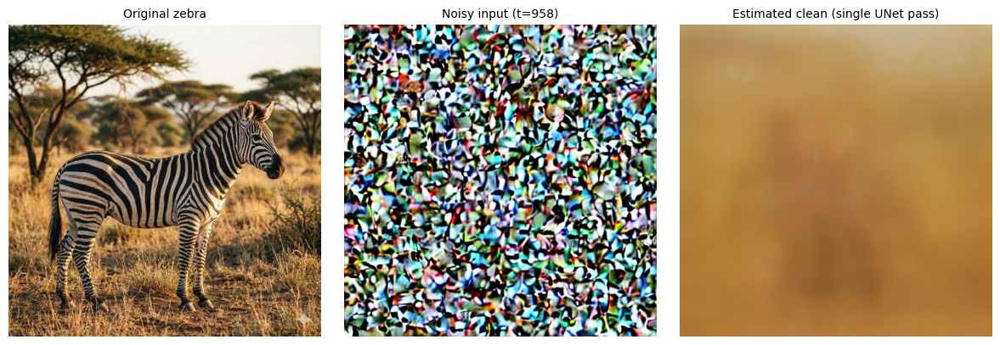

In [23]:
# --- Single UNet forward pass on an actual noised image ---
# Noise the zebra latent to the first denoising timestep, then run
# the UNet to see what it predicts.

num_steps = 30
scheduler = PNDMScheduler.from_config(pipe.scheduler.config)
scheduler.set_timesteps(num_steps)

first_t = scheduler.timesteps[0]  # first (noisiest) denoising step
t_tensor = torch.tensor([first_t], device=device)
alpha_bar_t = scheduler.alphas_cumprod[first_t].to(device)

# Noise the zebra latent to this timestep
noise = torch.randn_like(latent)
noisy_latent = (alpha_bar_t**0.5) * latent + ((1 - alpha_bar_t) ** 0.5) * noise

# UNet predicts the noise
noisy_input = scheduler.scale_model_input(noisy_latent, first_t)
with torch.no_grad():
    predicted_noise = unet(noisy_input, t_tensor, encoder_hidden_states=text_embeddings).sample

# Estimate clean latent from the prediction
x0_hat = (noisy_latent - ((1 - alpha_bar_t) ** 0.5) * predicted_noise) / (alpha_bar_t**0.5)

print(f"Timestep          : t = {first_t.item()}")
print(f"alpha_bar_t       : {alpha_bar_t:.4f}")
print(f"UNet input shape  : {noisy_latent.shape}")
print(f"UNet output shape : {predicted_noise.shape}")

# Decode and visualize
with torch.no_grad():
    dec_noisy = vae.decode(noisy_latent / scaling_factor).sample
    dec_x0hat = vae.decode(x0_hat / scaling_factor).sample

show_images(
    [tensor_to_image(img_tensor), tensor_to_image(dec_noisy), tensor_to_image(dec_x0hat)],
    ["Original zebra", f"Noisy input (t={first_t.item()})", "Estimated clean (single UNet pass)"],
    figsize_per=4,
)

---
## 5. The Denoising Loop (Reverse Process)

To generate an image from scratch, we start from pure noise and
iteratively denoise using the UNet. At each step the UNet predicts the
noise in the current latent and the scheduler uses this to compute a
cleaner latent. SD v1.5 uses PNDMScheduler, a deterministic ODE solver similar
to DDIM but with a higher-order (linear multi-step) integrator, which
gives good results in few steps (here 30 instead of the 1000 needed by
the stochastic DDPM sampler).

Stable Diffusion was trained with classifier-free guidance (CFG): at each
step the UNet runs twice (once with the text prompt, once with an empty
prompt) and the two predictions are combined with a guidance scale $s$ to
steer generation toward the prompt. $s = 7.5$ is the default.

In [24]:
# --- Denoising loop with CFG ---

gen_prompt = "a photograph of a zebra in the savanna"
guidance_scale = 7.5

# Unconditional embeddings (empty prompt) for CFG
uncond_tokens = tokenizer(
    "", padding="max_length",
    max_length=tokenizer.model_max_length,
    truncation=True, return_tensors="pt",
)
with torch.no_grad():
    uncond_embeds = text_encoder(uncond_tokens.input_ids.to(device))[0]

# Concatenate for batched inference: [unconditional, conditional]
text_cond = torch.cat([uncond_embeds, text_embeddings])  # (2, 77, 768)

scheduler = PNDMScheduler.from_config(pipe.scheduler.config)
scheduler.set_timesteps(num_steps)

generator = torch.Generator(device="cpu").manual_seed(42)
latents = torch.randn(1, 4, 64, 64, generator=generator, dtype=dtype).to(device)
latents = latents * scheduler.init_noise_sigma

store_every = max(1, num_steps // 8)
intermediates = []

for i, t in enumerate(tqdm(scheduler.timesteps, desc="Denoising")):
    latent_model_input = torch.cat([latents] * 2)
    latent_model_input = scheduler.scale_model_input(latent_model_input, t)

    with torch.no_grad():
        noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_cond).sample

    noise_pred_uncond, noise_pred_cond = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_cond - noise_pred_uncond)

    latents = scheduler.step(noise_pred, t, latents).prev_sample

    if i % store_every == 0 or i == num_steps - 1:
        intermediates.append((i, t.item(), latents.clone()))

Denoising:   0%|          | 0/31 [00:00<?, ?it/s]

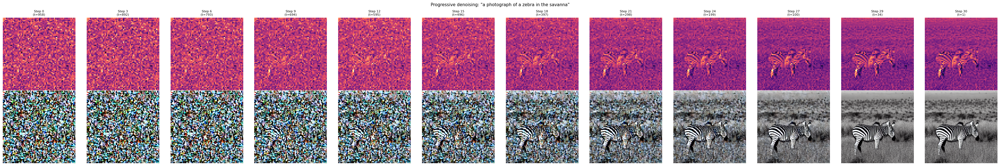

In [25]:
# --- Visualize progressive denoising ---

fig, axes = plt.subplots(2, len(intermediates), figsize=(3 * len(intermediates), 6))

for col, (step_i, t_val, lat) in enumerate(intermediates):
    axes[0, col].imshow(lat[0, 0].cpu().float().numpy(), cmap="magma")
    axes[0, col].set_title(f"Step {step_i}\n(t={t_val:.0f})", fontsize=8)
    axes[0, col].axis("off")

    with torch.no_grad():
        dec = vae.decode(lat / scaling_factor).sample
    axes[1, col].imshow(tensor_to_image(dec))
    axes[1, col].axis("off")

axes[0, 0].set_ylabel("Latent ch. 0", fontsize=9)
axes[1, 0].set_ylabel("Decoded image", fontsize=9)
fig.suptitle(f"Progressive denoising: \"{gen_prompt}\"", fontsize=11)
plt.tight_layout()
plt.show()

---
## 6. Full Pipeline: Putting It All Together

Let's compare our manual loop with the built-in pipeline output.
Both use PNDMScheduler, so results should be very similar (small
floating-point differences may remain).

  0%|          | 0/30 [00:00<?, ?it/s]

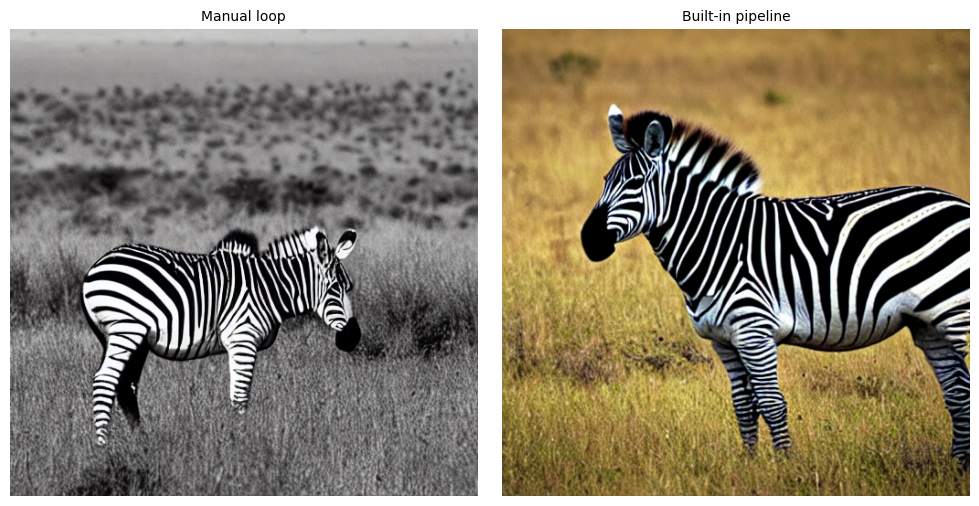

In [26]:
# --- Compare manual result with pipeline output ---

with torch.no_grad():
    manual_image = vae.decode(latents / scaling_factor).sample

# Run built-in pipeline with same seed
pipe_generator = torch.Generator(device=device).manual_seed(42)
pipe_result = pipe(
    gen_prompt,
    num_inference_steps=num_steps,
    guidance_scale=guidance_scale,
    generator=pipe_generator,
    output_type="pt",
).images  # (1, 3, H, W) in [0, 1]

# Convert pipeline output to [-1, 1] range for our display function
pipe_img = pipe_result * 2.0 - 1.0

show_images(
    [tensor_to_image(manual_image), tensor_to_image(pipe_img)],
    ["Manual loop", "Built-in pipeline"],
    figsize_per=5,
)

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

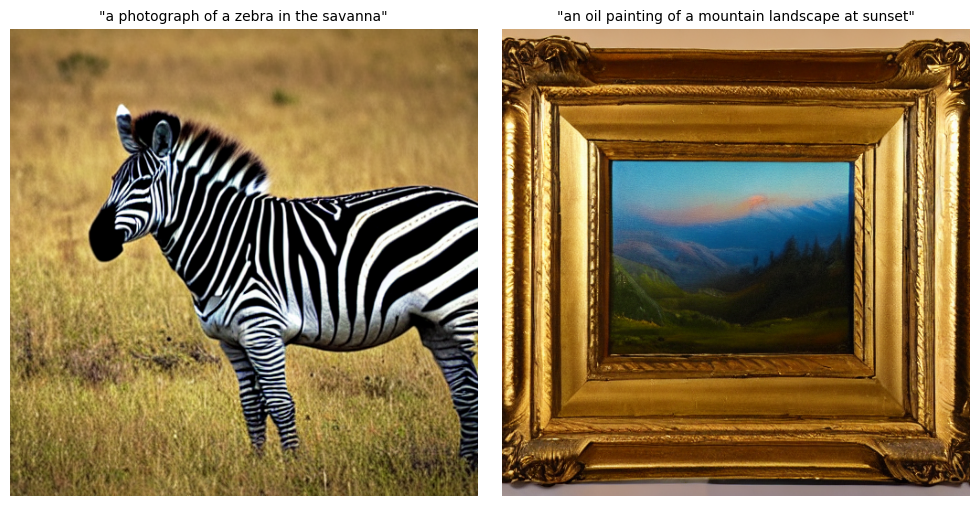

In [27]:
# --- Different prompt, same seed → different image ---
# This shows the effect of text conditioning.

alt_prompt = "an oil painting of a mountain landscape at sunset"
pipe_generator = torch.Generator(device=device).manual_seed(42)

alt_result = pipe(
    alt_prompt,
    num_inference_steps=num_steps,
    guidance_scale=guidance_scale,
    generator=pipe_generator,
).images[0]

pipe_generator = torch.Generator(device=device).manual_seed(42)
orig_result = pipe(
    gen_prompt,
    num_inference_steps=num_steps,
    guidance_scale=guidance_scale,
    generator=pipe_generator,
).images[0]

show_images(
    [np.array(orig_result) / 255.0, np.array(alt_result) / 255.0],
    [f"\"{gen_prompt}\"", f"\"{alt_prompt}\""],
    figsize_per=5,
)